# Integrated data analysis with neuronal subclustering v3#
This version includes neuonal subsluctering, batch distribution, but no differential QC cut-offs

In [6]:
import scanpy as sc
import pandas as pd
import anndata
import os
import re
import numpy as np
import scipy
import seaborn
import bbknn
import matplotlib
import matplotlib.pyplot as plt
import importlib
import importlib.util
spec = importlib.util.spec_from_file_location("ScanpyUtilsMT", os.path.expanduser("../../utils/ScanpyUtilsMT.py"))
sc_utils = importlib.util.module_from_spec(spec)
spec.loader.exec_module(sc_utils)
figdir='/wynton/group/ye/mtschmitz/figures/macaqueWbMbPresupervise/'
sc.settings.figdir=figdir
sc.settings.file_format_figs='pdf'
sc.settings.autosave=True
sc.settings.autoshow=False


In [2]:
pwd

'/Users/sara/Dropbox (DNPL)/Sara Nolbrant/Postdoc Pollen lab/Macaque single cell data/Midbrain'

In [3]:
#set a path to your working directory
datapath='/wynton/group/ye/mtschmitz/macaquedevbrain/CAT202002_kallisto'

In [4]:
#some helper functions that Matthew has written for processing irregularities in the macaque dataset
def tp_format_macaque(name):
    if isinstance(name, str):
        name=re.sub('PEC_YALE','E110',name)
        name=re.sub('PEC_Yale','E110',name)
        name=re.sub('Mac2','E65',name)
        searched=re.search("E[0-9]+",name)
        if searched is None:
            return('nan')
        tp=re.sub("^E","",searched.group(0))
        tp=float(tp)
        return(tp)
    else:
        return('nan')

def region_format_macaque(name):
    if isinstance(name, str):
        name=name.upper()
        name=re.sub('PEC_YALE_SINGLECELLRNASEQ_RMB[0-9]+','',name)
        name=re.sub('MAC2','',name)
        name=re.sub("E80MGE","E80_GE",name)
        name=re.sub('E[0-9]+',"",name)
        name=re.sub("-2019A_","",name)
        name=re.sub("-2019B_","",name)
        name=re.sub("-2019A_AND_E65-2019B_","",name)
        name=re.sub("-2019_","",name)
        name=re.sub("^_","",name)
        name=re.sub("CGE-LGE","CGE_AND_LGE",name)
        name=re.sub("LGE_AND_CGE","CGE_AND_LGE",name)
        name=re.sub("_1","",name)
        name=re.sub("_2","",name)
        name=re.sub("_OUT","",name)
        name=re.sub("_KOUT","",name)
        name=re.sub(".LOOM","",name)
        return(name)
    else:
        region='nan'
    return(region)

def macaque_correct_regions(regionlist):
    regionkey={'thal':'thalamus',
               'hippo':'hippocampus',
               'somato':'somatosensory',
               'hypo':'hypothalamus',
               'midbrain/pons':'midbrain',
               'motor-1':'motor',
               'motor-2':'motor',
               'temp':'temporal',
               'hip':'hippocampus',
               'cbc':'cerebellum',
               'md':'thalamus'}
    newl=[]
    for l in regionlist:
        l=l.lower()
        if l in regionkey.keys():
            l=regionkey[l]
        newl.append(l)
    return(newl)


In [5]:
fileNameList=os.listdir(datapath)
#filter the directories in your directory
fileList=[f for f in fileNameList if os.path.exists(os.path.join(datapath,f,'outs','filtered_feature_bc_matrix.h5'))]



In [6]:
print(fileNameList)

['Written_files', '.DS_Store', 'E80-2019_Midbrain_out', 'Midbrain_E65A v1.ipynb', 'Macaque_Midbrain copy.xlsx', 'Macaque_Midbrain_integrated_v1.h5ad', 'E65A_filtered_feature_bc_matrix.h5', 'Integrated Macaque Midbrain data v2.html', 'E65-2019A_Midbrain_out', 'Midbrain_E65A v2.ipynb', 'Macaque_Midbrain.xlsx', '~$Macaque_Midbrain_integrated _data.xlsx', 'E90_filtered_feature_bc_matrix.h5', 'E40_Midbrain_out', 'E65-2019B_Midbrain_out', 'Midbrain_E65B v1.ipynb', 'Integrated Macaque Midbrain data v3.ipynb', 'MacaqueMidbrainSupervisedCellNames.txt', 'Midbrain_E40 v2.ipynb', 'Integrated Macaque Midbrain data v1.html', 'figures', 'E65B_filtered_feature_bc_matrix.h5', 'Midbrain_E80 v1.ipynb', 'E90-2019_Midbrain_out', '.ipynb_checkpoints', 'Integrated Macaque Midbrain data v2.ipynb', 'E80_filtered_feature_bc_matrix.h5', 'Midbrain_E40 v2 - 1000 genes.html', 'E40_filtered_feature_bc_matrix.h5', 'Midbrain_E40 v1.ipynb', 'Midbrain_E80 v2.ipynb', 'Macaque_Midbrain_integrated _data.xlsx', 'Midbrain_E9

In [7]:
print(fileList)

['E80-2019_Midbrain_out', 'E65-2019A_Midbrain_out', 'E40_Midbrain_out', 'E65-2019B_Midbrain_out', 'E90-2019_Midbrain_out']


In [8]:
adatas=[]

for f in fileList:
    print(f)
    adata = sc.read_10x_h5(os.path.join(datapath,f,'outs','filtered_feature_bc_matrix.h5'))
    #Get rid of -1 in cell barcodes
    adata.obs.index=[re.sub("-[0-9]+","",x) for x in adata.obs.index]
    adata.uns['name']=f
    print (adata.uns)
    adata.obs['batch_name']=str(adata.uns['name'])
    print (adata.obs)
    adata.obs_names_make_unique()
    adatas.append(adata)
  

E80-2019_Midbrain_out


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


OrderedDict([('name', 'E80-2019_Midbrain_out')])
                             batch_name
AAACCCAAGACCGCCT  E80-2019_Midbrain_out
AAACCCAAGAGGACTC  E80-2019_Midbrain_out
AAACCCAAGTGGTTCT  E80-2019_Midbrain_out
AAACCCACAAGTTCCA  E80-2019_Midbrain_out
AAACCCACAATCCTTT  E80-2019_Midbrain_out
...                                 ...
TTTGTTGGTAACATAG  E80-2019_Midbrain_out
TTTGTTGGTGCCGGTT  E80-2019_Midbrain_out
TTTGTTGGTGCGGATA  E80-2019_Midbrain_out
TTTGTTGGTGGTGATG  E80-2019_Midbrain_out
TTTGTTGTCAAGCTTG  E80-2019_Midbrain_out

[9212 rows x 1 columns]
E65-2019A_Midbrain_out


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


OrderedDict([('name', 'E65-2019A_Midbrain_out')])
                              batch_name
AAACCCAAGACTTCAC  E65-2019A_Midbrain_out
AAACCCAAGCACTTTG  E65-2019A_Midbrain_out
AAACCCACAACCCTAA  E65-2019A_Midbrain_out
AAACCCACAAGTGCTT  E65-2019A_Midbrain_out
AAACCCACAGGAATAT  E65-2019A_Midbrain_out
...                                  ...
TTTGTTGGTGACCGAA  E65-2019A_Midbrain_out
TTTGTTGTCCGGTAAT  E65-2019A_Midbrain_out
TTTGTTGTCGAACGCC  E65-2019A_Midbrain_out
TTTGTTGTCGGTGTTA  E65-2019A_Midbrain_out
TTTGTTGTCGTTCCCA  E65-2019A_Midbrain_out

[12364 rows x 1 columns]
E40_Midbrain_out


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


OrderedDict([('name', 'E40_Midbrain_out')])
                        batch_name
AAACCTGAGCTGAACG  E40_Midbrain_out
AAACCTGAGGTGTGGT  E40_Midbrain_out
AAACCTGCACTTACGA  E40_Midbrain_out
AAACCTGCAGGTGCCT  E40_Midbrain_out
AAACCTGGTACTCAAC  E40_Midbrain_out
...                            ...
TTTGTCAGTAAAGGAG  E40_Midbrain_out
TTTGTCAGTACAAGTA  E40_Midbrain_out
TTTGTCAGTACAGCAG  E40_Midbrain_out
TTTGTCAGTTCAGACT  E40_Midbrain_out
TTTGTCAGTTGCTCCT  E40_Midbrain_out

[5075 rows x 1 columns]
E65-2019B_Midbrain_out


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


OrderedDict([('name', 'E65-2019B_Midbrain_out')])
                              batch_name
AAACCCAAGCGCCTCA  E65-2019B_Midbrain_out
AAACCCAAGGAGTCTG  E65-2019B_Midbrain_out
AAACGAACAGAAATCA  E65-2019B_Midbrain_out
AAACGCTTCCCGAGGT  E65-2019B_Midbrain_out
AAAGAACCAAGCGAGT  E65-2019B_Midbrain_out
...                                  ...
TTTGACTTCCCGAGAC  E65-2019B_Midbrain_out
TTTGGAGCAAGTGCTT  E65-2019B_Midbrain_out
TTTGGAGCATGAATAG  E65-2019B_Midbrain_out
TTTGGTTAGAAGCCTG  E65-2019B_Midbrain_out
TTTGGTTGTACAGAAT  E65-2019B_Midbrain_out

[2590 rows x 1 columns]
E90-2019_Midbrain_out


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


OrderedDict([('name', 'E90-2019_Midbrain_out')])
                             batch_name
AAACCCAAGGCCTGAA  E90-2019_Midbrain_out
AAACCCAAGTTAACGA  E90-2019_Midbrain_out
AAACCCACAACCAGAG  E90-2019_Midbrain_out
AAACCCACAAGTAGTA  E90-2019_Midbrain_out
AAACCCACACAGCCTG  E90-2019_Midbrain_out
...                                 ...
TTTGTTGGTCTTCCGT  E90-2019_Midbrain_out
TTTGTTGGTTGACTGT  E90-2019_Midbrain_out
TTTGTTGGTTTACTGG  E90-2019_Midbrain_out
TTTGTTGTCAAATGAG  E90-2019_Midbrain_out
TTTGTTGTCTTTACAC  E90-2019_Midbrain_out

[9625 rows x 1 columns]


In [9]:
print(adatas)

[AnnData object with n_obs × n_vars = 9212 × 74390 
    obs: 'batch_name'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'name', AnnData object with n_obs × n_vars = 12364 × 74390 
    obs: 'batch_name'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'name', AnnData object with n_obs × n_vars = 5075 × 74390 
    obs: 'batch_name'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'name', AnnData object with n_obs × n_vars = 2590 × 74390 
    obs: 'batch_name'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'name', AnnData object with n_obs × n_vars = 9625 × 74390 
    obs: 'batch_name'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'name']


In [10]:
print(adata.var.index)

Index(['PGBD2', 'RNU6-1205P', 'CATG00000101888.1', 'AL672291.1', 'ZNF692',
       'CATG00000042688.1', 'ZNF672', 'CATG00000101836.1', 'MIR3124',
       'SH3BP5L',
       ...
       'ND4', 'ENSMMUG00000028676', 'ENSMMUG00000028675', 'ENSMMUG00000028674',
       'ND5', 'ND6', 'ENSMMUG00000028671', 'CYTB', 'ENSMMUG00000028669',
       'ENSMMUG00000028668'],
      dtype='object', length=74390)


In [11]:
#Just be sure every batch has a unique name
adata.obs['clean_cellname']=[re.sub('-[0-9]+','',x) for x in  adata.obs.index]
adata.obs['full_cellname']=adata.obs['clean_cellname'].astype(str)+'_'+adata.obs['batch_name'].astype(str)
adata.obs.index=adata.obs['full_cellname']
adata.var_names_make_unique()

In [13]:
adata=anndata.AnnData.concatenate(*adatas) #This line needs to be run twice to work - I don't know why!

Making variable names unique for controlled concatenation.


In [14]:
#saving all the datasets together will allow you to pick up where you left off
#h5ad stores whole anndata data structure
adata.write('/Users/sara/Dropbox (DNPL)/Sara Nolbrant/Postdoc Pollen lab/Macaque single cell data/Midbrain/Macaque_Midbrain_integrated_v1.h5ad')        



... storing 'batch_name' as categorical
... storing 'clean_cellname' as categorical
... storing 'full_cellname' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [15]:
adata.raw=adata

AnnData object with n_obs × n_vars = 38866 × 74390 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome'


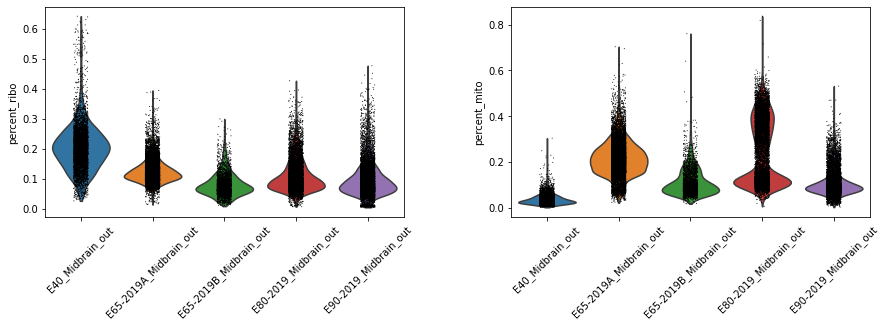

In [16]:
ribo_genes=[name for name in adata.var_names if name.startswith('RPS') or name.startswith('RPL') ]
adata.obs['percent_ribo'] = np.sum(
adata[:, ribo_genes].X, axis=1) / np.sum(adata.X, axis=1)
mito_genes = [name for name in adata.var_names if name in ['ND1','ND2','ND4L','ND4','ND5','ND6','ATP6','ATP8','CYTB','COX1','COX2','COX3'] or 'MT-' in name]
adata.obs['percent_mito'] = np.sum(
adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
print(adata)
sc.pl.violin(adata,groupby='batch_name',keys=['percent_ribo','percent_mito'],rotation=45,save='ribomito')

cells=[]
for b in adata.obs['batch_name'].unique():
    cells+=list(adata.obs.index[(adata.obs['percent_mito']<mitochondria_cutoffs[b]) & adata.obs['batch_name']==b])
print(cells)
adata=adata._inplace_subset_obs(cells)

In [17]:
#set these cutoffs depending on the dataset
adata._inplace_subset_obs(adata.obs['percent_ribo']<.4)
adata._inplace_subset_obs(adata.obs['percent_mito']<.2) #I used either 0.15 or 0.3 for seperate batch analsyis
#Get rid of mito genes
#adata._inplace_subset_var(~adata.var.index.isin(mito_genes))
print(adata)

AnnData object with n_obs × n_vars = 26153 × 74390 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'batch_name_colors'


Text(0.5, 1.0, 'Genes Per Cell')

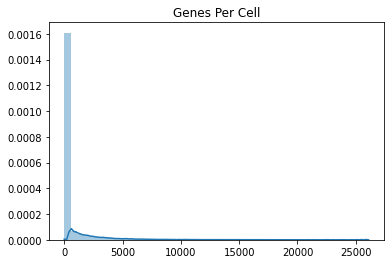

In [18]:
#Plot the distribution of number of genes per cell
seaborn.distplot((adata.X>0).sum(0).A1)
plt.title('Genes Per Cell')

In [19]:
#basic filtering to get n_genes added to obs
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_genes(adata, min_cells=3)

In [20]:
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = adata.X.sum(axis=1)

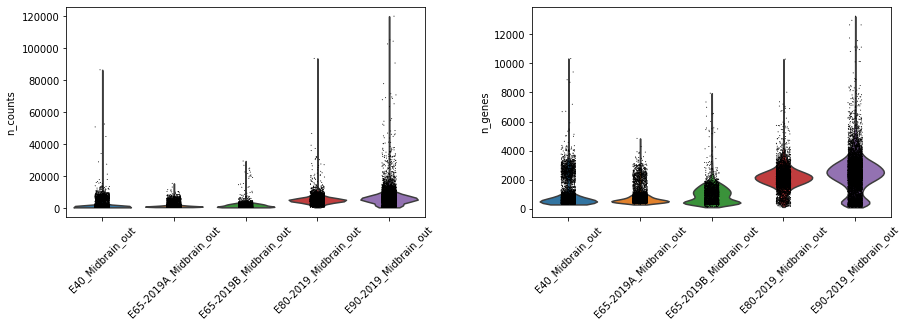

In [21]:
#n_genes after basic filtering
sc.pl.violin(adata,groupby='batch_name',keys=['n_counts','n_genes'],rotation=45,save='n_genes') #Not working if not doing the basic filtering to get obs: n_genes 

In [22]:
print(adata)

AnnData object with n_obs × n_vars = 26144 × 40024 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'batch_name_colors'


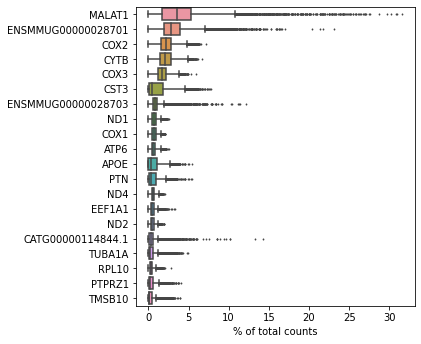

AnnData object with n_obs × n_vars = 18162 × 31119 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'batch_name_colors'


/Users/sara/opt/anaconda3/envs/Scanpy-env/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


In [23]:
sc.pp.filter_genes(adata,min_cells=10) #I used 3 for seperate batch analsyis
#sc.pp.filter_cells(adata,min_counts=1000)
sc.pp.filter_cells(adata,min_genes=600) #I used 600 or 1000 for seperate batch analsyis
sc.pp.filter_cells(adata,max_genes=4000) #I introduced this line
sc.pl.highest_expr_genes(adata, n_top=20, )
print(adata)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,n_top_genes=15000,batch_key='batch_name',subset=False)
sc.pp.scale(adata,max_value=10)
sc.pp.pca(adata,n_comps=100) #I used 50 for seperate batch analsyis
#sc.pp.neighbors(adata)
bbknn.bbknn(adata,batch_key='batch_name',n_pcs=100,neighbors_within_batch=3)
sc.tl.leiden(adata,resolution=1.5)
sc.tl.umap(adata,spread=2)

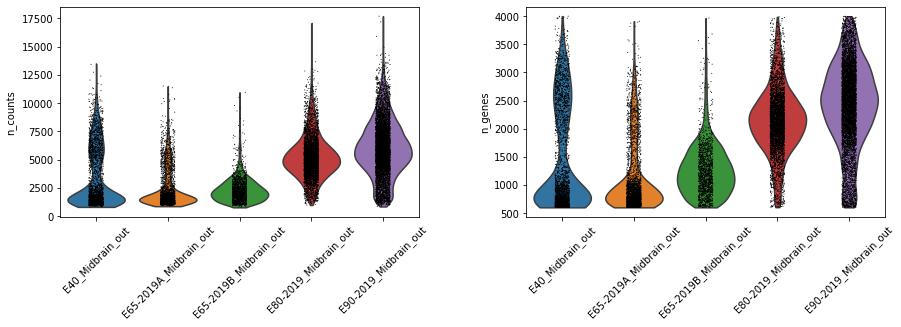

In [24]:
#n_genes after compltet filtering
sc.pl.violin(adata,groupby='batch_name',keys=['n_counts','n_genes'],rotation=45,save='n_genes 2')

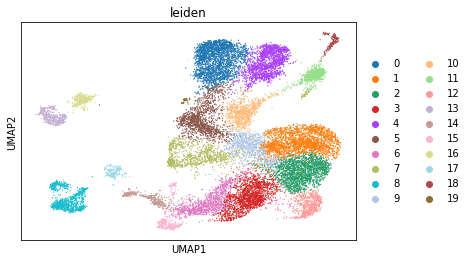

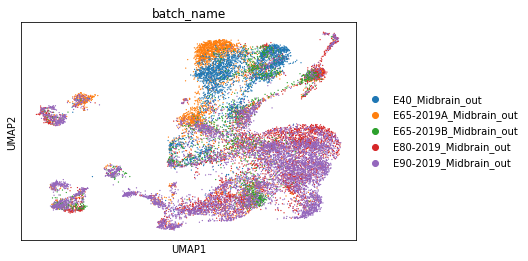

In [25]:
sc.pl.umap(adata,color=['leiden'],save='leiden')
sc.pl.umap(adata,color=['batch_name'],save='batch_name')
#sc.pl.umap(adata,color=['timepoint'],save='timepoint')

# Supervised annotation of clusters
It's often a large waste of time to cluster and recluster. The section below provides tools for analyzing the clusters and how to save and reload your annotations

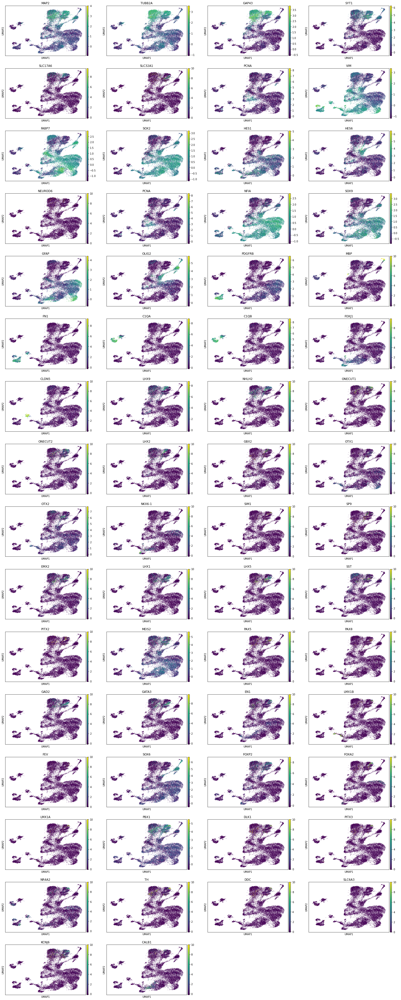

In [26]:
#Plot some marker genes so you get a sense of what is where
easygenes= ['MAP2', 'TUBB2A', 'GAP43', 'SYT1', 'SLC17A6', 'SLC32A1','PCNA', 'VIM', 'FABP7', 'SOX2', 'HES1', 'HES6', 'NEUROD6', 'PCNA', 'MIK67', 'NFIA', 'SOX9','GFAP', 'OLIG2', 'PDGFRB', 'MBP', 'FN1', 'C1QA', 'C1QB', 'FOXJ1', 'CLDN5', 'LHX9', 'NHLH2', 'ONECUT1', 'ONECUT2', 'LHX2', 'GBX2', 'OTX1', 'OTX2', 'NKX6-1', 'SIM1', 'SP9', 'EMX2', 'LHX1', 'LHX5', 'SST', 'PITX2', 'MEIS2', 'PAX5', 'PAX8', 'GAD2', 'GATA3', 'EN1', 'LMX1B', 'FEV', 'SOX6', 'FOXP2', 'FOXA2', 'LMX1A','PBX1','DLK1','PITX3','NR4A2', 'TH', 'DDC','SLC6A3','KCNJ6','CALB1']
easygenes=[x for x in easygenes if x in adata.var.index]
sc.pl.umap(adata,color=easygenes,use_raw=False,save='FaveGenes')

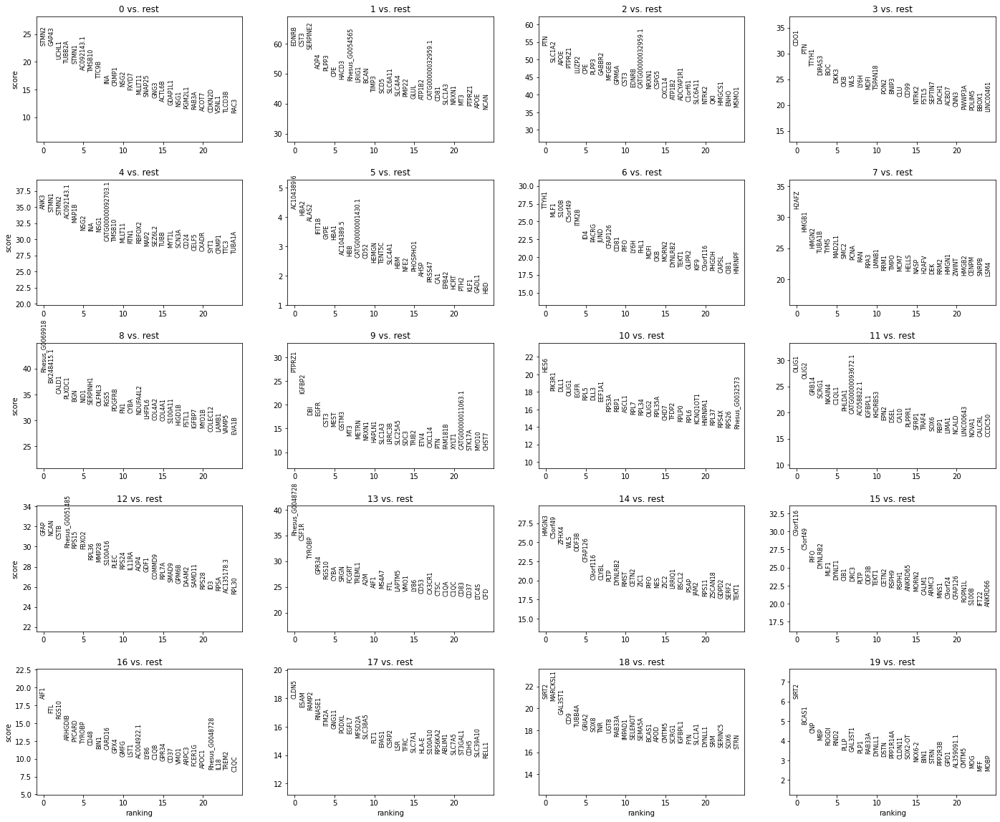

In [27]:
#basic logistic regression to get list of differential expression
#sc.tl.filter_rank_genes_groups(adata,groupby='leiden',min_in_group_fraction=.2,max_out_group_fraction=.1)
sc.tl.rank_genes_groups(adata,groupby='leiden',min_in_group_fraction=.2,max_out_group_fraction=.1)

sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [28]:
# Show the 50 top ranked genes per cluster in a dataframe.
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,STMN2,EDNRB,PTN,CDO1,ANK3,AC104389.6,TTYH1,H2AFZ,Rhesus_G0069918,PTPRZ1,HES6,OLIG1,GFAP,Rhesus_G0048728,HMGN3,C9orf116,AIF1,CLDN5,SIRT2,SIRT2
1,GAP43,CST3,SLC1A2,PTN,STMN1,HBA2,MLF1,HMGB1,BX248415.1,IGFBP2,PIK3R1,OLIG2,NCAN,CSF1R,C5orf49,C5orf49,FTL,ESAM,MARCKSL1,BCAS1
2,UCHL1,SERPINE2,APOE,TTYH1,STMN2,ALAS2,S100B,HMGN2,CALD1,DBI,DLL1,GRB14,CSTB,TYROBP,ZFHX4,PIFO,RGS10,RAMP2,GAL3ST1,CNP
3,TUBB2A,AQP4,PTPRZ1,DIRAS3,AC092143.1,IFIT1B,C5orf49,TUBA1B,PLXDC1,EGFR,OLIG1,SCRG1,Rhesus_G0051485,GPR34,WLS,DYNLRB2,ARHGDIB,RNASE1,CD9,MBP
4,STMN1,PLPP3,LUZP2,BOC,MAP1B,GYPE,ITM2B,TYMS,BGN,CST3,EGFR,NKAIN4,RPS15,RGS10,ODF3B,MLF1,PYCARD,ITM2A,TUBB4A,ROGDI
5,AC092143.1,CPE,CPE,DKK3,NSG2,HBA1,ID4,MAD2L1,NID1,MEST,RPL5,C1QL1,FBXO2,CYBA,CFAP126,DYNLT1,TYROBP,GNG11,GRIA2,RND2
6,TMSB10,HACD3,PLPP3,CKB,INA,AC104389.5,PACRG,SMC2,SERPINH1,GSTM3,DLL3,PHLDA1,RPL36,SRGN,C9orf116,CIB1,CD48,PODXL,SOX8,PLLP
7,TTC9B,Rhesus_G0054565,GABBR2,WLS,NSG1,HBB,JUND,PCNA,OLFML3,MT3,EEF1A1,CATG00000093672.1,MMP28,FCGRT,CLYBL,DRC3,BIN1,EGFL7,TNR,GAL3ST1
8,INA,LRIG1,MFGE8,LY6H,CATG00000092703.1,CATG00000001430.1,CFAP126,RAN,RGS5,METRN,RPS3A,AC058822.1,S100A16,TREML1,PLTP,PLTP,CARD16,MFSD2A,UGT8,PLP1
9,CRMP1,BCAN,GPM6A,MDFI,TMSB10,CD52,CD81,RPA3,PDGFRB,NRXN1,RBP1,IGFBPL1,PLEC,A2M,DYNLRB2,ODF3B,GPX4,SLC38A5,RAB33A,RAB33A


In [29]:
result=adata.uns['rank_genes_groups']
groups=result['names'].dtype.names
df=pd.DataFrame({group + '_' + key[:1]: result[key][group] for group in groups for key in ['names', 'scores']})
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(df.iloc[0:50,:])

           0_n        0_s                1_n        1_s                2_n  \
0        STMN2  23.017712              EDNRB  59.490135                PTN   
1        GAP43  22.933352               CST3  59.064022             SLC1A2   
2        UCHL1  20.505404           SERPINE2  58.207844               APOE   
3       TUBB2A  19.774374               AQP4  51.752911             PTPRZ1   
4        STMN1  19.716959              PLPP3  51.156235              LUZP2   
5   AC092143.1  18.528553                CPE  49.106216                CPE   
6       TMSB10  18.145847              HACD3  48.181702              PLPP3   
7        TTC9B  17.033108    Rhesus_G0054565  47.686977             GABBR2   
8          INA  16.161304              LRIG1  47.251385              MFGE8   
9        CRMP1  15.687815               BCAN  46.949142              GPM6A   
10        NSG2  15.587933              TIMP3  44.001621               CST3   
11       FXYD7  14.961539               SCD5  43.653183         

In [30]:
print(adata)

AnnData object with n_obs × n_vars = 18162 × 31119 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_name_colors', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'


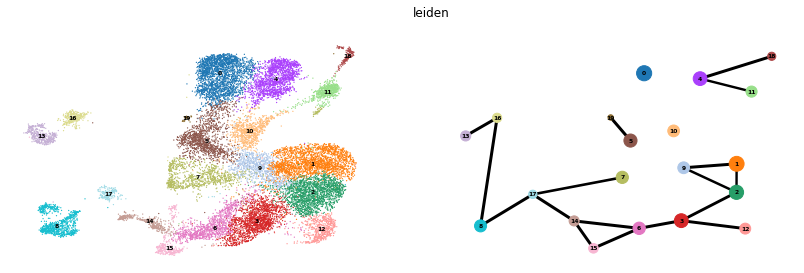

In [31]:
#supervising cluster naming, which cluster is which?
sc.tl.paga(adata,groups='leiden')
sc.pl.paga_compare(adata,legend_fontsize=6,arrowsize=10,edge_width_scale=.4,threshold=np.quantile(adata.uns['paga']['connectivities'].data,.9))


In [32]:
#Change the values of this dictionary to assign the name you want to each of the leiden clusters
labeldict={'0':'Neurons 1','1':'Astrocytes 1','2':'Astrocytes 2','3':'MEIS2+/WNT7B+/FABP7+ progenitor cells',
           '4':'Neurons 2','5':'Radial glia/early progenitors', '6':'Progenitor cells','7':'Cycling cells',
           '8':'Vascular cells','9':'Glial progenitors','10':'OPC 1','11':'OPC 2',
           '12':'Astrocytes (GFAP high)','13':'Microglia 1', '14':'ZIC+/VIM+ progenitors',
           '15':'Ependymal cells', '16':'Microglia 2', '17':'Endothelial cells', 
           '18':'Oligodendrocytes 1', '19':'Oligodendrocytes 2'}

... storing 'supervised_name' as categorical


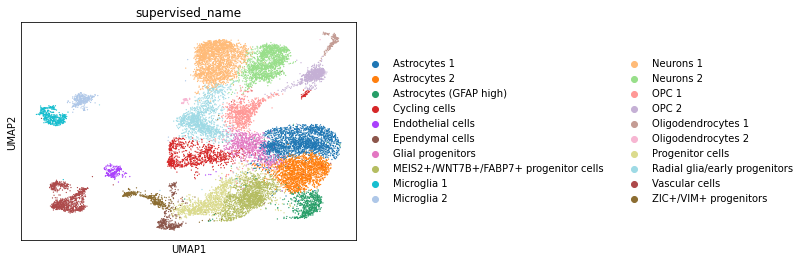

In [33]:
#Assign a supervised name for each leiden cluster
#Will error out if you missed a cluster
adata.obs['supervised_name']=[labeldict[x] for x in adata.obs['leiden']]
sc.pl.umap(adata,color=['supervised_name'],save='supervised_name')

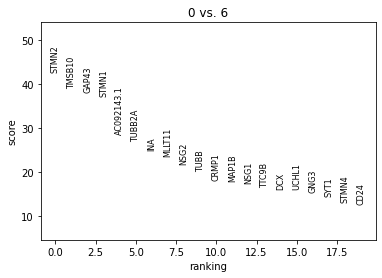

In [34]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='6', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

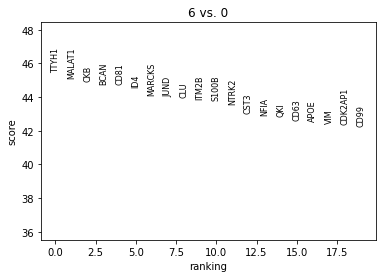

In [35]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['6'], reference='0', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['6'], n_genes=20)

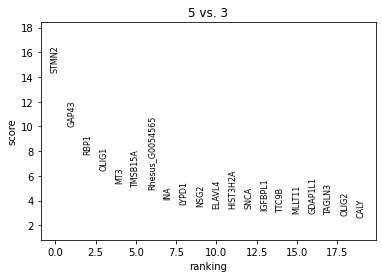

In [36]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['5'], reference='3', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['5'], n_genes=20)

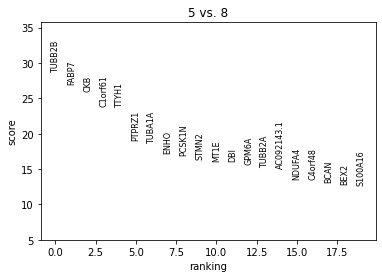

In [37]:
sc.tl.rank_genes_groups(adata, 'leiden', groups=['5'], reference='8', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['5'], n_genes=20)

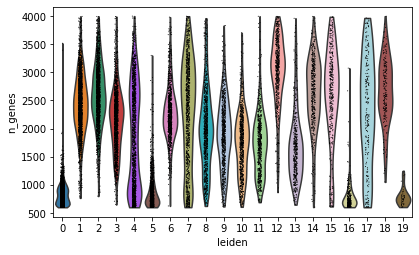

In [38]:
sc.pl.violin(adata, 'n_genes', groupby='leiden')

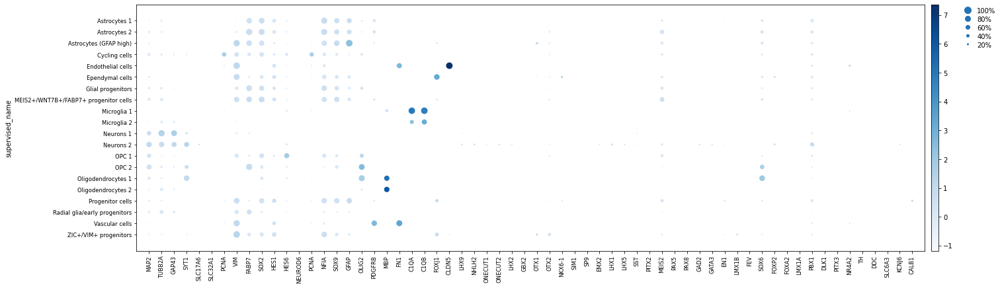

In [39]:
# After annotating the cell types, visualize the marker genes
ax = sc.pl.dotplot(adata, easygenes, color_map='Blues', groupby='supervised_name', use_raw=False)

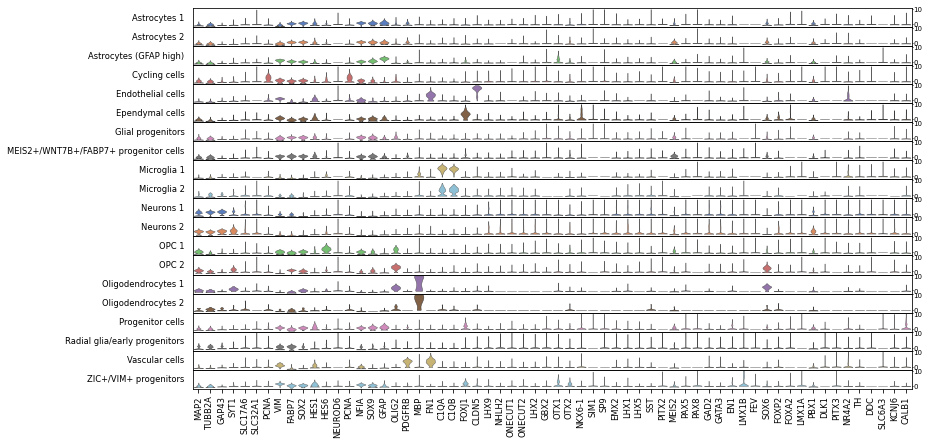

In [40]:
# Violin plot
ax = sc.pl.stacked_violin(adata, easygenes, groupby='supervised_name', use_raw=False, rotation=90)

In [41]:
#Save your supervised names with the ATGC.._batch-name cell names 
#Note, if you change the cell names or change QC, you may get nan instead
adata.obs.loc[:,['full_cellname','supervised_name']].to_csv('/Users/sara/Dropbox (DNPL)/Sara Nolbrant/Postdoc Pollen lab/Macaque single cell data/Midbrain/MacaqueMidbrainSupervisedCellNames.txt',index=None)

# Visualizing distributions across batches#

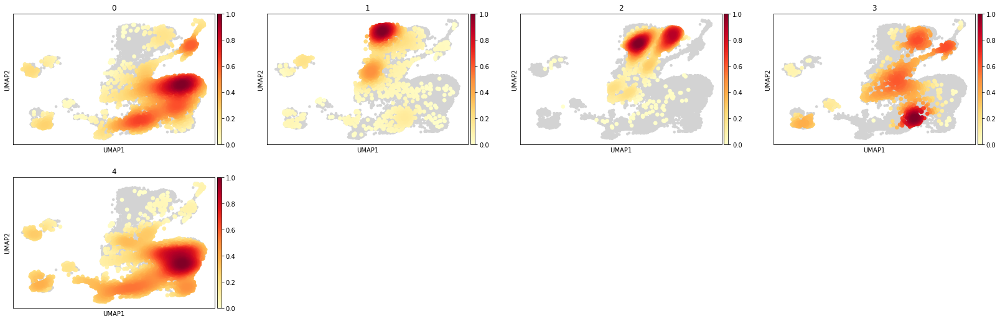

In [42]:
sc.tl.embedding_density(adata, groupby='batch')
sc.pl.embedding_density(adata, groupby='batch')

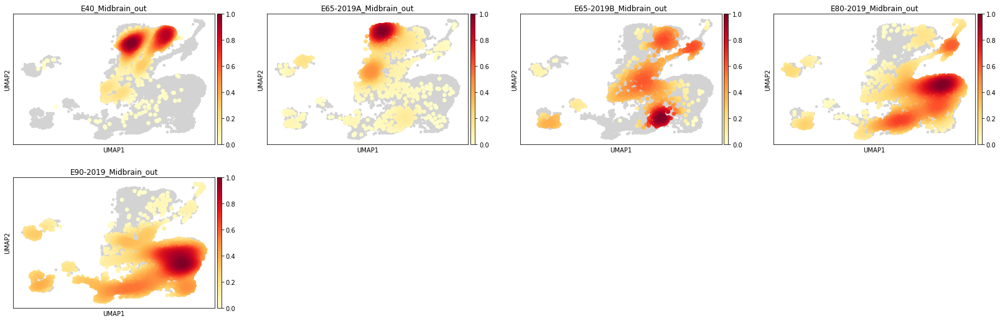

In [43]:
sc.tl.embedding_density(adata, groupby='batch_name')
sc.pl.embedding_density(adata, groupby='batch_name')

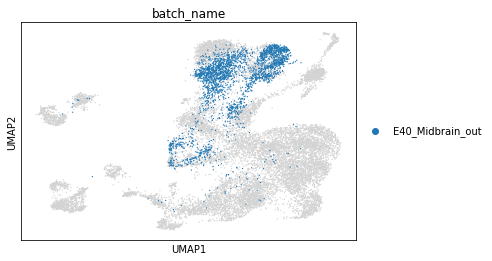

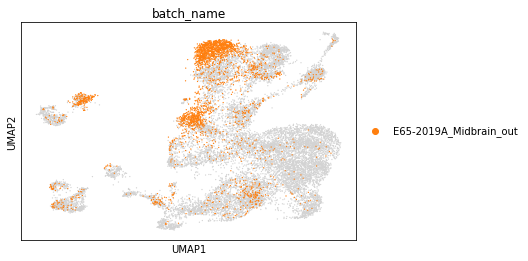

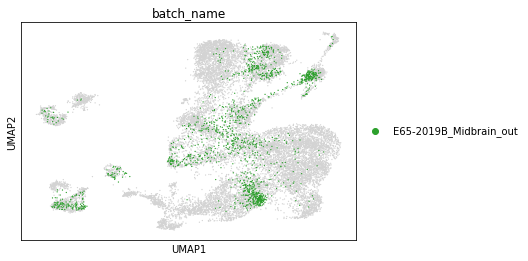

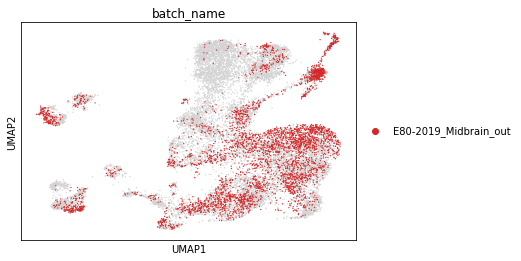

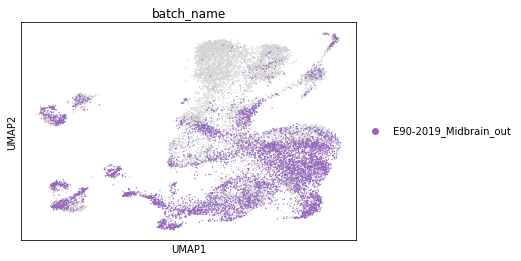

In [44]:
for batch_name in ['E40_Midbrain_out', 'E65-2019A_Midbrain_out', 'E65-2019B_Midbrain_out', 'E80-2019_Midbrain_out', 'E90-2019_Midbrain_out']:
    sc.pl.umap(adata, color='batch_name', groups=[batch_name])

<Figure size 432x288 with 0 Axes>

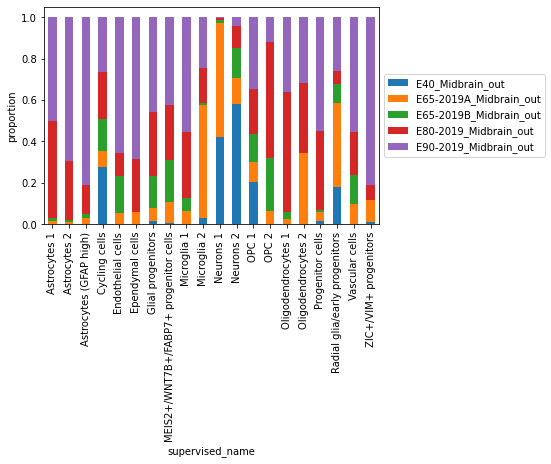

In [45]:
f = plt.figure()
df_plot = adata.obs.groupby(['supervised_name', 'batch_name']).size().reset_index().pivot(columns='batch_name', index='supervised_name', values=0).apply(lambda g: g / g.sum(),1)
ax = df_plot.plot(kind='bar', legend=False,stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('proportion')
ax.get_figure().savefig(os.path.join(sc.settings.figdir,'supervisedVbatchBar.pdf'), bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

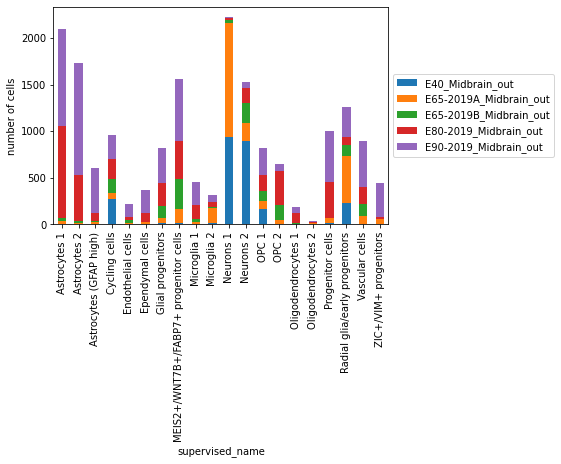

In [46]:
f = plt.figure()
df_plot = adata.obs.groupby(['supervised_name', 'batch_name']).size().reset_index().pivot(columns='batch_name', index='supervised_name', values=0)
ax = df_plot.plot(kind='bar', legend=False,stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('number of cells')
ax.get_figure().savefig(os.path.join(sc.settings.figdir,'supervisedVbatchBar.pdf'), bbox_inches="tight")

In [47]:
print(adata)

AnnData object with n_obs × n_vars = 18162 × 31119 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts', 'leiden', 'supervised_name', 'umap_density_batch', 'umap_density_batch_name'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_name_colors', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'paga', 'leiden_sizes', 'supervised_name_colors', 'umap_density_batch_params', 'umap_density_batch_name_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'


Text(0, 0.5, 'number of cells')

<Figure size 432x288 with 0 Axes>

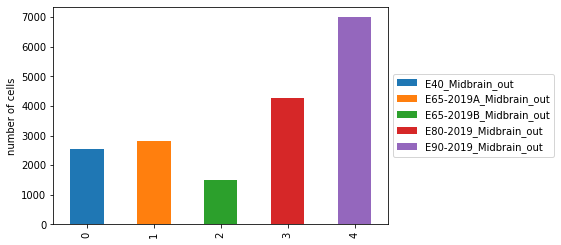

In [48]:
f = plt.figure()
df_plot = adata.obs.groupby(['batch_name']).size().reset_index().pivot(columns='batch_name', values=0)
ax = df_plot.plot(kind='bar', stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('number of cells')


# Subclutering neuronal clusters#

In [89]:
adata_subset = adata[adata.obs['leiden'].isin(['0','4'])]

In [90]:
print(adata_subset)

View of AnnData object with n_obs × n_vars = 3754 × 31119 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts', 'leiden', 'supervised_name', 'umap_density_batch', 'umap_density_batch_name'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_name_colors', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'paga', 'leiden_sizes', 'supervised_name_colors', 'umap_density_batch_params', 'umap_density_batch_name_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'


In [91]:
sc.pp.pca(adata_subset)

In [92]:
bbknn.bbknn(adata_subset,batch_key='batch_name',neighbors_within_batch=3)

In [93]:
sc.tl.leiden(adata_subset,resolution=1.5)

In [94]:
sc.tl.umap(adata_subset,spread=2)

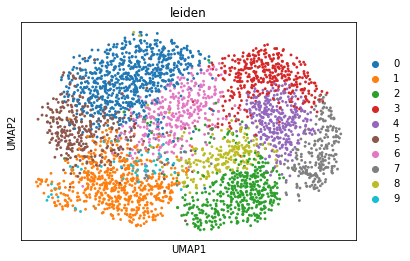

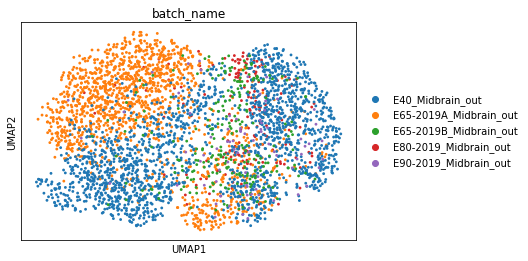

In [95]:
sc.pl.umap(adata_subset,color=['leiden'])
sc.pl.umap(adata_subset,color=['batch_name'])

In [96]:
subsetgenes= ['MAP2', 'TUBB2A', 'GAP43', 'SYT1', 'SLC17A6', 'SLC32A1','PCNA', 'VIM', 'FABP7', 'SOX2', 'HES1', 'HES6', 'NEUROD6', 'NFIA', 'SOX9','GFAP', 'OLIG2', 'PDGFRB', 'MBP', 'FN1', 'C1QA', 'C1QB', 'FOXJ1', 'CLDN5', 'LHX9', 'NHLH2', 'ONECUT1', 'ONECUT2', 'LHX2', 'GBX2', 'OTX1', 'OTX2', 'NKX6-1', 'SIM1', 'SP9', 'EMX2', 'LHX1', 'LHX5', 'SST', 'PITX2', 'MEIS2', 'PAX5', 'PAX8', 'GAD2', 'GATA3', 'EN1', 'LMX1B', 'FEV', 'SOX6', 'FOXP2', 'FOXA2', 'LMX1A','PBX1','DLK1','PITX3','NR4A2', 'TH', 'DDC','SLC6A3','KCNJ6','CALB1']
subsetgenes=[x for x in subsetgenes if x in adata_subset.var.index]

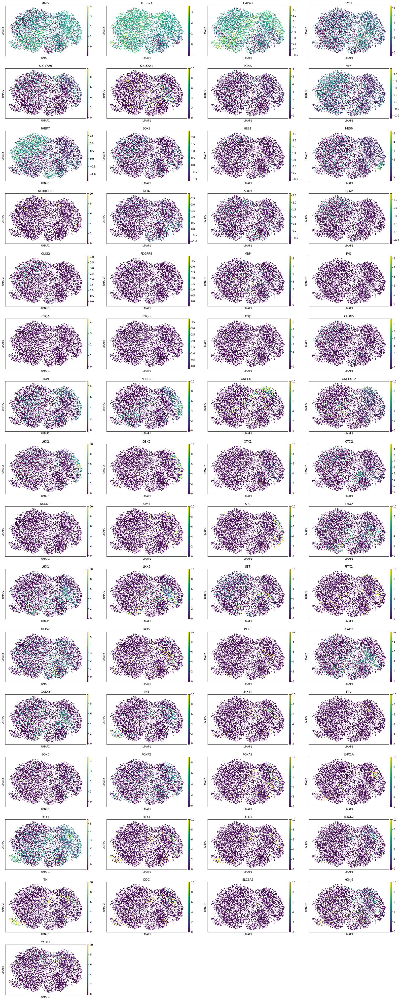

In [97]:
sc.pl.umap(adata_subset,color=subsetgenes, use_raw=False)

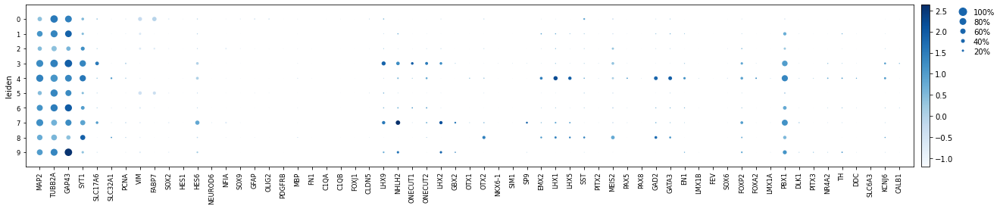

In [98]:
ax = sc.pl.dotplot(adata_subset, subsetgenes, color_map='Blues', groupby='leiden', use_raw=False)

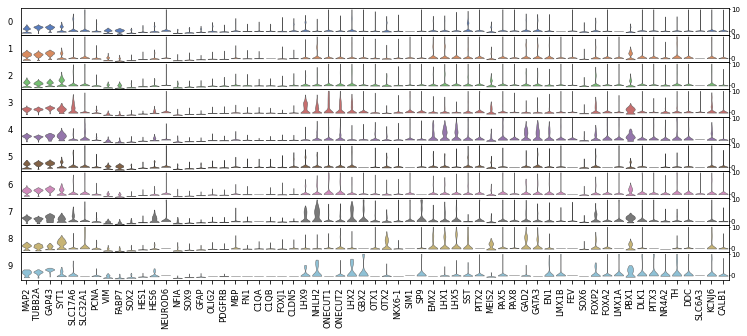

In [99]:
ax = sc.pl.stacked_violin(adata_subset, subsetgenes, groupby='leiden', use_raw=False, rotation=90)

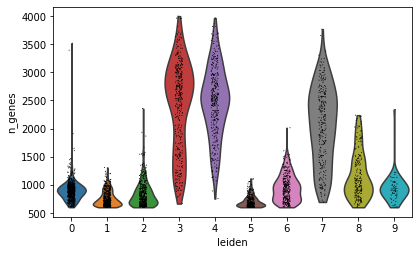

In [100]:
sc.pl.violin(adata_subset, 'n_genes', groupby='leiden')

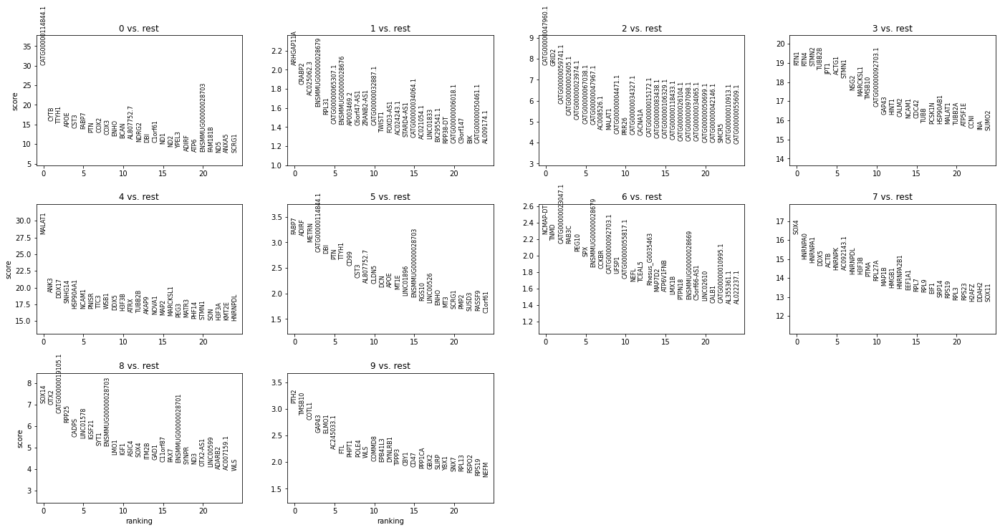

In [101]:
sc.tl.rank_genes_groups(adata_subset,groupby='leiden',min_in_group_fraction=.2,max_out_group_fraction=.1)
sc.pl.rank_genes_groups(adata_subset, n_genes=25, sharey=False)

In [102]:
# Show the 50 top ranked genes per cluster in a dataframe.
pd.DataFrame(adata_subset.uns['rank_genes_groups']['names']).head(50)

,0,1,2,3,4,5,6,7,8,9
0,CATG00000114844.1,ARHGAP11A,CATG00000047960.1,RTN1,MALAT1,FABP7,NCMAP-DT,SOX4,SOX14,PTH2
1,CYTB,CRABP2,GRID2,RTN4,ANK3,ADIRF,TNMD,HNRNPA0,OTX2,TMSB10
2,TTYH1,AC025062.3,CATG00000059741.1,STMN2,DDX17,METRN,CATG00000023047.1,HNRNPA1,CATG00000019105.1,COTL1
3,APOE,ENSMMUG00000028679,CATG00000002605.1,TUBB2B,SNHG14,CATG00000114844.1,RAB3C,DDX5,RPP25,GAP43
4,CST3,RPL31,CATG00000023974.1,JPT1,HSP90AA1,DBI,PEG10,ACTB,CADPS,ELMO1
5,FABP7,CATG00000065307.1,CATG00000067038.1,ACTG1,NCAM1,PTN,SPX,HNRNPK,LINC01578,AC245033.1
6,PTN,ENSMMUG00000028676,CATG00000047967.1,STMN1,PNISR,TTYH1,ENSMMUG00000028679,AC092143.1,IGSF21,FTL
7,COX2,AP003469.2,AC008526.1,NSG2,TTC3,CD99,CCKBR,HNRNPDL,SYT1,PHPT1
8,COX3,C6orf47-AS1,MALAT1,MARCKSL1,WSB1,CST3,CATG00000092703.1,H3F3B,ENSMMUG00000028703,POLE4
9,ENHO,ZRANB2-AS1,CATG00000004471.1,TMSB10,DDX5,AL807752.7,UFSP1,PTMA,LMO1,WLS


In [103]:
print(adata_subset)

AnnData object with n_obs × n_vars = 3754 × 31119 
    obs: 'batch', 'batch_name', 'clean_cellname', 'full_cellname', 'percent_ribo', 'percent_mito', 'n_genes', 'n_counts', 'leiden', 'supervised_name', 'umap_density_batch', 'umap_density_batch_name'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'batch_name_colors', 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'rank_genes_groups', 'paga', 'leiden_sizes', 'supervised_name_colors', 'umap_density_batch_params', 'umap_density_batch_name_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'


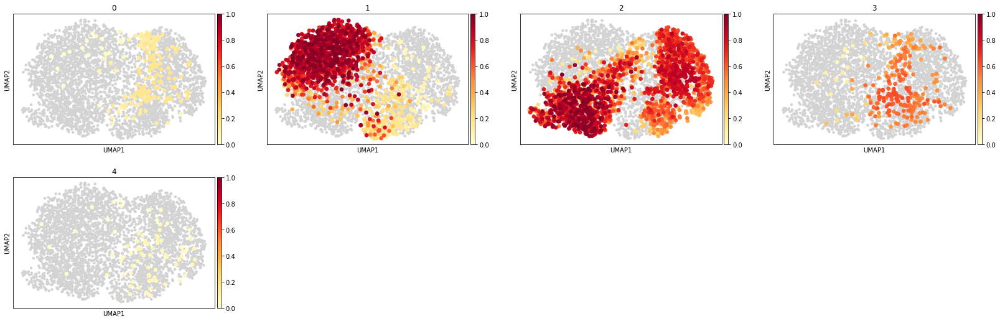

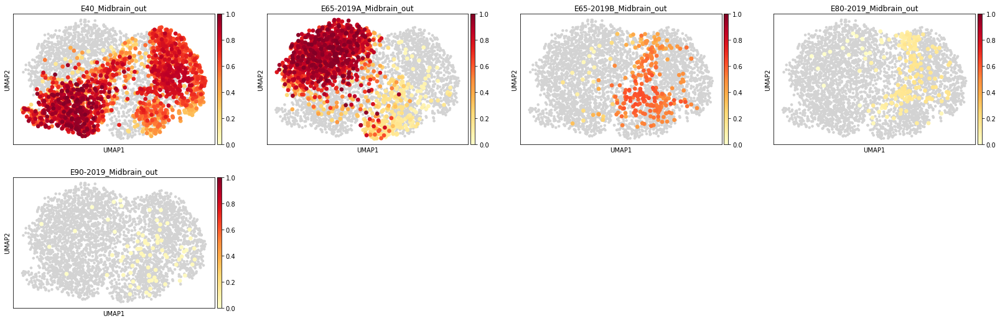

In [104]:
sc.pl.embedding_density(adata_subset, groupby='batch')
sc.pl.embedding_density(adata_subset, groupby='batch_name')

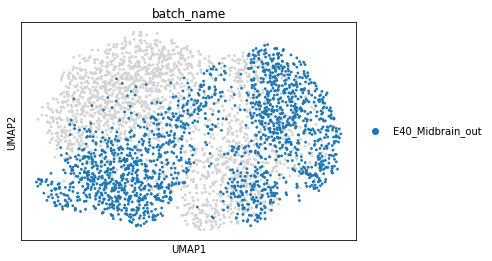

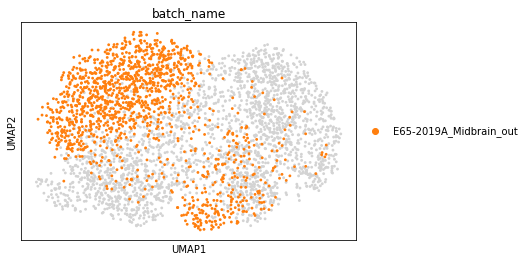

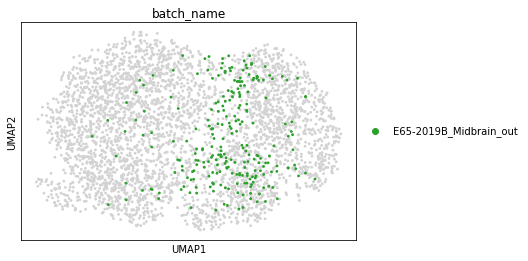

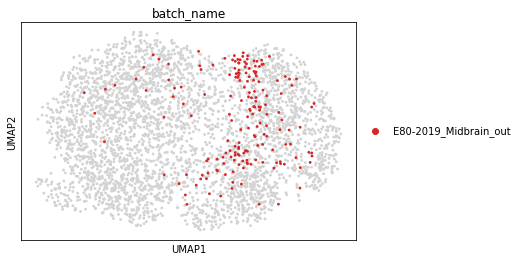

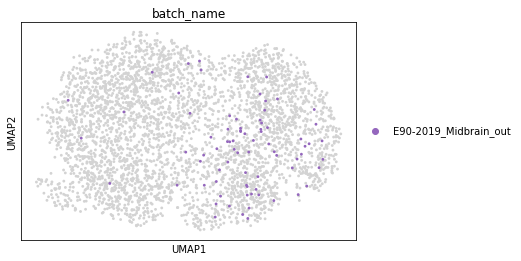

In [105]:
for batch_name in ['E40_Midbrain_out','E65-2019A_Midbrain_out', 'E65-2019B_Midbrain_out', 'E80-2019_Midbrain_out', 'E90-2019_Midbrain_out']:
    sc.pl.umap(adata_subset, color='batch_name', groups=[batch_name])

<Figure size 432x288 with 0 Axes>

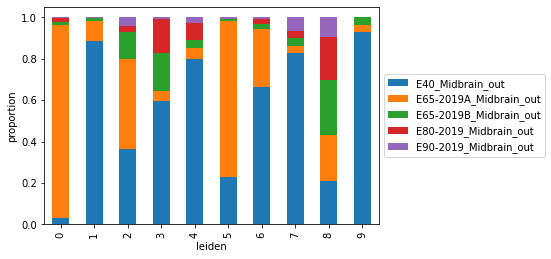

In [106]:
f = plt.figure()
df_plot = adata_subset.obs.groupby(['leiden', 'batch_name']).size().reset_index().pivot(columns='batch_name', index='leiden', values=0).apply(lambda g: g / g.sum(),1)
ax = df_plot.plot(kind='bar', legend=False,stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('proportion')
ax.get_figure().savefig(os.path.join(sc.settings.figdir,'supervisedVbatchBar2.pdf'), bbox_inches="tight")

<Figure size 432x288 with 0 Axes>

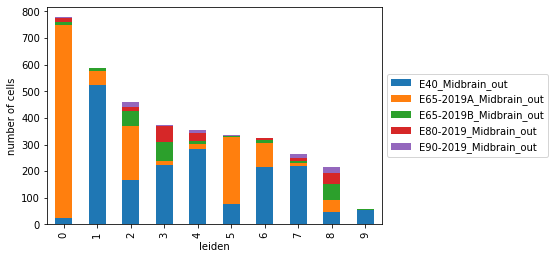

In [107]:
f = plt.figure()
df_plot = adata_subset.obs.groupby(['leiden', 'batch_name']).size().reset_index().pivot(columns='batch_name', index='leiden', values=0)
ax = df_plot.plot(kind='bar', legend=False,stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('number of cells')
ax.get_figure().savefig(os.path.join(sc.settings.figdir,'supervisedVbatchBar2.pdf'), bbox_inches="tight")

Text(0, 0.5, 'number of cells')

<Figure size 432x288 with 0 Axes>

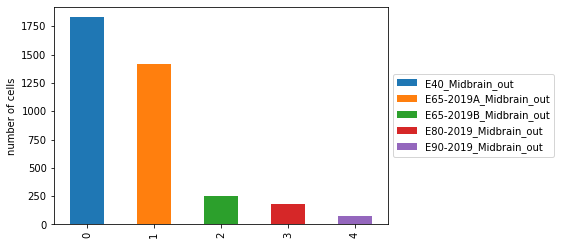

In [108]:
f = plt.figure()
df_plot = adata_subset.obs.groupby(['batch_name']).size().reset_index().pivot(columns='batch_name', values=0)
ax = df_plot.plot(kind='bar', stacked=True)
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.ylabel('number of cells')

